# **Convolutional Neural Network Filter Bank for Musical Instruments Classification**

# Professor Supervisor: Prof. Gerald Schuller
# Research Assistant Supervisor: Renato de C. R. Profeta
# Author: Param Tushar Gadam
# Date: October, 2020
# Master of Science in Communications and Signal Processing, Ilmenau University of Technology, Germany

# **Colab Runtime Configurations**

In [1]:
pip install tensorboard pandas

In [2]:
pip install matplotlib seaborn

In [3]:
# Install torchaudio
!pip install torchaudio -f https://download.pytorch.org/whl/torch_stable.html
#!pip install torch==1.7.0+cu101 torchvision==0.8.1+cu101 torchaudio==0.7.0 -f https://download.pytorch.org/whl/torch_stable.html

Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |████████████████████████████████| 1.9MB 9.6MB/s 


# **Imports and Configuration**

In [4]:
# Imports

## Numerical Computing
import numpy as np
import itertools

## File System and Files Handling
import os
from zipfile import ZipFile

## Python Serialization
import pickle

## Audio Processing
import librosa.display, librosa
import torchaudio

## Plotting and Visualization
import matplotlib.pyplot as plt
import IPython.display as ipd
from IPython.core.display import HTML, display, Image

## Machine Learning ´
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.metrics import recall_score, precision_score, accuracy_score
from sklearn.metrics import confusion_matrix, f1_score, classification_report
from sklearn.metrics import mean_squared_error

## Deep Learning
import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.tensorboard import SummaryWriter

from packaging import version

import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
from scipy import stats
import tensorboard as tb
import numpy as np
from torchsummary import summary

In [5]:
# Seeds for reproducibility
torch.manual_seed(0)
np.random.seed(0)

In [6]:
## Check CPU or GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)
#map_location=torch.device('cpu')
#please use torch.load with map_location=torch.device('cpu') to map your storages to the CPU.
#torch.load(map_location)

cuda


In [7]:
# Configure Tensorboard
%load_ext tensorboard

In [ ]:
#logs_base_dir = "runs"
#os.makedirs(logs_base_dir, exist_ok=True)

# **Download the dataset from Dropbox**

In [8]:
# Download the dataset from Dropbox
!wget -O dataset.zip https://www.dropbox.com/s/su4rvaipccm1lit/all-samples_npy_pkl.zip?dl=0

--2021-06-22 15:26:43--  https://www.dropbox.com/s/su4rvaipccm1lit/all-samples_npy_pkl.zip?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.4.18, 2620:100:6022:18::a27d:4212
Connecting to www.dropbox.com (www.dropbox.com)|162.125.4.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/su4rvaipccm1lit/all-samples_npy_pkl.zip [following]
--2021-06-22 15:26:44--  https://www.dropbox.com/s/raw/su4rvaipccm1lit/all-samples_npy_pkl.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc913637a677966938219ff21be7.dl.dropboxusercontent.com/cd/0/inline/BQ5Ag9fL12tjfThhA4Pl2eZKz5uvEyCUImo_5FBfECjxODcs-dbHa8nXfU7ED5R9Z5wubD7r-tggHbUUr2WBwy6PvfS94Fp-sgn7YiFT0ykUk9To-XsEA1Bny09oU-riE_eE9GIBn4zGkdLQ6g1DyINJ/file# [following]
--2021-06-22 15:26:44--  https://uc913637a677966938219ff21be7.dl.dropboxusercontent.com/cd/0/inline/BQ5Ag9fL12tjfThhA4Pl2eZKz5uvEyCUImo_5FBfECjxODcs-db

# **Extract .zip**

In [9]:
with ZipFile('dataset.zip', 'r') as zipObj:
   # Extract all the contents of zip file in current directory
   zipObj.extractall()

# **Get Dataset Metadata from GitHub**

In [10]:
# Clone github in Google Colab
!git clone https://github.com/param1707/-Optimizing-a-neural-network-filter-bank-for-musical-instrument-classification-.git

Cloning into '-Optimizing-a-neural-network-filter-bank-for-musical-instrument-classification-'...
remote: Enumerating objects: 2785, done.
remote: Counting objects: 100% (47/47), done.
remote: Compressing objects: 100% (40/40), done.
remote: Total 2785 (delta 28), reused 12 (delta 7), pack-reused 2738
Receiving objects: 100% (2785/2785), 2.21 GiB | 39.61 MiB/s, done.
Resolving deltas: 100% (1663/1663), done.
Checking out files: 100% (441/441), done.


In [11]:
# Load Train Set
with open('./-Optimizing-a-neural-network-filter-bank-for-musical-instrument-classification-/datasetMetadata/train_set_dataframe.pkl', 'rb') as f:
  train_set = pickle.load(f)
#Load Test Set
with open('./-Optimizing-a-neural-network-filter-bank-for-musical-instrument-classification-/datasetMetadata/test_set_dataframe.pkl', 'rb') as f:
  test_set = pickle.load(f)

# **Encode Labels**

In [12]:
# Encode Labels Test Set
labelencoder = LabelEncoder()
labelencoder.fit(test_set['class'].values.tolist())
print(len(labelencoder.classes_), "classes:", ", ".join(list(labelencoder.classes_)))
classes_int_test = labelencoder.transform(test_set['class'].values.tolist())

#OneHotEncoding
encoder=OneHotEncoder(sparse=False, categories="auto")
onehot_labels_test=encoder.fit_transform(classes_int_test.reshape(len(classes_int_test),1))

20 classes: banjo, bass-clarinet, bassoon, cello, clarinet, contrabassoon, double-bass, english-horn, flute, french-horn, guitar, mandolin, oboe, percussion, saxophone, trombone, trumpet, tuba, viola, violin


# **Create PyTorch Datasets for Training and Testing**

In [13]:
# Dataset Class
class dataset(Dataset):
    """An abstract class representing a Dataset.

    Author: Renato de Castro Rabelo Profeta, October 2020, TU Ilmenau Germany
    """
    def __init__(self, files, labels):
        self.labels = labels
        self.files = files

    def __len__(self):
        return len(self.files)

    def __getitem__(self, index):
      x_numpy = np.load(self.files[index])
      X = torch.from_numpy(x_numpy)
      X /= torch.abs(X).max()  # Normalize
      X = torch.reshape(X,(1,-1)) # Reshape for Model
      y_labels = torch.tensor(self.labels[index]) #Labels Out
      return X,y_labels

In [14]:
# Create Sets
#train_set_torch = dataset(train_set['filename'].values.tolist(), onehot_labels_train)
test_set_torch = dataset(test_set['filename'].values.tolist(), onehot_labels_test)

In [15]:
# Data Loader.
#training_generator = DataLoader(train_set_torch, batch_size=1, shuffle=False, num_workers=0)
validation_generator = DataLoader(test_set_torch, batch_size=1, shuffle=False, num_workers=0)

# **Testing Dataset and Dataloader**

In [16]:
# Get a random audio file and label from dataset
dataiter = iter(DataLoader(test_set_torch, batch_size=1, shuffle=True, num_workers=0))
audio_to_test, label_to_test = dataiter.next()

In [17]:
# Calculate Spectrogram of the audio file to test
specgram = torchaudio.transforms.Spectrogram(n_fft=2048)(audio_to_test[0,0,:])

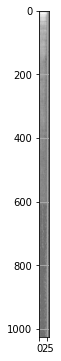

In [18]:
# Plot Spectrogram of audio to test
plt.figure(figsize=(10,6))
plt.imshow(20*specgram.log10().numpy(), cmap='gray')
plt.grid()

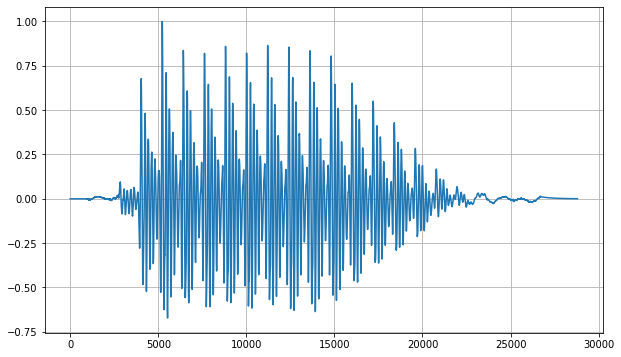

In [19]:
# Plot Waveform of audio to test
plt.figure(figsize=(10,6))
plt.plot(audio_to_test[0,0,:])
plt.grid()

In [20]:
# Listen to audio
ipd.Audio(audio_to_test[0,0,:], rate=44100) # load a local WAV file

# **Visualising tensorboard data from runs.zip**

In [ ]:
!unzip /content/-Optimizing-a-neural-network-filter-bank-for-musical-instrument-classification-/Experiment4/runs.zip -d runs

Archive:  /content/-Optimizing-a-neural-network-filter-bank-for-musical-instrument-classification-/Experiment4/runs.zip
   creating: runs/content/runs/
   creating: runs/content/runs/Nov20_13-36-52_6e74146b77c2/
   creating: runs/content/runs/Nov20_13-36-52_6e74146b77c2/Losses_Train Total Loss/
  inflating: runs/content/runs/Nov20_13-36-52_6e74146b77c2/Losses_Train Total Loss/events.out.tfevents.1605879570.6e74146b77c2.57.5  
   creating: runs/content/runs/Nov20_13-36-52_6e74146b77c2/Classification Accuracy_Test Classification/
  inflating: runs/content/runs/Nov20_13-36-52_6e74146b77c2/Classification Accuracy_Test Classification/events.out.tfevents.1605879570.6e74146b77c2.57.8  
  inflating: runs/content/runs/Nov20_13-36-52_6e74146b77c2/events.out.tfevents.1605879414.6e74146b77c2.57.0  
   creating: runs/content/runs/Nov20_13-36-52_6e74146b77c2/Classification Accuracy_Train Classification /
  inflating: runs/content/runs/Nov20_13-36-52_6e74146b77c2/Classification Accuracy_Train Classif

In [ ]:
!unzip /content/-Optimizing-a-neural-network-filter-bank-for-musical-instrument-classification-/Experiment4/runs_230.zip -d runs

Archive:  /content/-Optimizing-a-neural-network-filter-bank-for-musical-instrument-classification-/Experiment4/runs_230.zip
   creating: runs/content/runs/Jan09_11-41-23_0fb393ae5dce/
   creating: runs/content/runs/Jan09_11-41-23_0fb393ae5dce/Losses_Train Total Loss/
  inflating: runs/content/runs/Jan09_11-41-23_0fb393ae5dce/Losses_Train Total Loss/events.out.tfevents.1610192875.0fb393ae5dce.57.5  
   creating: runs/content/runs/Jan09_11-41-23_0fb393ae5dce/Losses_Test Classification Loss/
  inflating: runs/content/runs/Jan09_11-41-23_0fb393ae5dce/Losses_Test Classification Loss/events.out.tfevents.1610192875.0fb393ae5dce.57.2  
   creating: runs/content/runs/Jan09_11-41-23_0fb393ae5dce/Classification Accuracy_Test Classification/
  inflating: runs/content/runs/Jan09_11-41-23_0fb393ae5dce/Classification Accuracy_Test Classification/events.out.tfevents.1610192875.0fb393ae5dce.57.8  
   creating: runs/content/runs/Jan09_11-41-23_0fb393ae5dce/Losses_Train Classification Loss/
  inflating: 

In [ ]:
!unzip /content/-Optimizing-a-neural-network-filter-bank-for-musical-instrument-classification-/Experiment4/runs_330.zip -d runs

Archive:  /content/-Optimizing-a-neural-network-filter-bank-for-musical-instrument-classification-/Experiment4/runs_330.zip
   creating: runs/content/runs/Jan10_12-13-01_1325d16c9a87/
   creating: runs/content/runs/Jan10_12-13-01_1325d16c9a87/Losses_Train Total Loss/
  inflating: runs/content/runs/Jan10_12-13-01_1325d16c9a87/Losses_Train Total Loss/events.out.tfevents.1610281066.1325d16c9a87.57.5  
  inflating: runs/content/runs/Jan10_12-13-01_1325d16c9a87/events.out.tfevents.1610280785.1325d16c9a87.57.0  
   creating: runs/content/runs/Jan10_12-13-01_1325d16c9a87/Losses_Test Classification Loss/
  inflating: runs/content/runs/Jan10_12-13-01_1325d16c9a87/Losses_Test Classification Loss/events.out.tfevents.1610281066.1325d16c9a87.57.2  
   creating: runs/content/runs/Jan10_12-13-01_1325d16c9a87/Classification Accuracy_Test Classification/
  inflating: runs/content/runs/Jan10_12-13-01_1325d16c9a87/Classification Accuracy_Test Classification/events.out.tfevents.1610281066.1325d16c9a87.57.

In [ ]:
!unzip /content/-Optimizing-a-neural-network-filter-bank-for-musical-instrument-classification-/Experiment4/runs_430.zip -d runs

Archive:  /content/-Optimizing-a-neural-network-filter-bank-for-musical-instrument-classification-/Experiment4/runs_430.zip
   creating: runs/content/runs/Jan11_09-42-13_225e8fdd0feb/
   creating: runs/content/runs/Jan11_09-42-13_225e8fdd0feb/Losses_Train Total Loss/
  inflating: runs/content/runs/Jan11_09-42-13_225e8fdd0feb/Losses_Train Total Loss/events.out.tfevents.1610358343.225e8fdd0feb.57.5  
   creating: runs/content/runs/Jan11_09-42-13_225e8fdd0feb/Losses_Test Classification Loss/
  inflating: runs/content/runs/Jan11_09-42-13_225e8fdd0feb/Losses_Test Classification Loss/events.out.tfevents.1610358343.225e8fdd0feb.57.2  
   creating: runs/content/runs/Jan11_09-42-13_225e8fdd0feb/Classification Accuracy_Test Classification/
  inflating: runs/content/runs/Jan11_09-42-13_225e8fdd0feb/Classification Accuracy_Test Classification/events.out.tfevents.1610358343.225e8fdd0feb.57.8  
   creating: runs/content/runs/Jan11_09-42-13_225e8fdd0feb/Losses_Train Classification Loss/
  inflating: 

In [ ]:
!unzip /content/-Optimizing-a-neural-network-filter-bank-for-musical-instrument-classification-/Experiment4/runs_530.zip -d runs

Archive:  /content/-Optimizing-a-neural-network-filter-bank-for-musical-instrument-classification-/Experiment4/runs_530.zip
   creating: runs/content/runs/Jan11_14-18-29_b0b1e6053e17/
   creating: runs/content/runs/Jan11_14-18-29_b0b1e6053e17/Losses_Train Total Loss/
  inflating: runs/content/runs/Jan11_14-18-29_b0b1e6053e17/Losses_Train Total Loss/events.out.tfevents.1610374904.b0b1e6053e17.58.5  
   creating: runs/content/runs/Jan11_14-18-29_b0b1e6053e17/Losses_Test Classification Loss/
  inflating: runs/content/runs/Jan11_14-18-29_b0b1e6053e17/Losses_Test Classification Loss/events.out.tfevents.1610374904.b0b1e6053e17.58.2  
  inflating: runs/content/runs/Jan11_14-18-29_b0b1e6053e17/events.out.tfevents.1610374713.b0b1e6053e17.58.0  
   creating: runs/content/runs/Jan11_14-18-29_b0b1e6053e17/Classification Accuracy_Test Classification/
  inflating: runs/content/runs/Jan11_14-18-29_b0b1e6053e17/Classification Accuracy_Test Classification/events.out.tfevents.1610374904.b0b1e6053e17.58.

In [ ]:
!unzip -o /content/-Optimizing-a-neural-network-filter-bank-for-musical-instrument-classification-/Experiment4/runs_600.zip -d runs

Archive:  /content/-Optimizing-a-neural-network-filter-bank-for-musical-instrument-classification-/Experiment4/runs_600.zip
   creating: runs/content/runs/Apr11_09-06-53_187a40316b1f/
   creating: runs/content/runs/Apr11_09-06-53_187a40316b1f/Losses_Test Decoder Loss*w/
  inflating: runs/content/runs/Apr11_09-06-53_187a40316b1f/Losses_Test Decoder Loss*w/events.out.tfevents.1618132225.187a40316b1f.64.4  
  inflating: runs/content/runs/Apr11_09-06-53_187a40316b1f/events.out.tfevents.1618132015.187a40316b1f.64.0  
   creating: runs/content/runs/Apr11_09-06-53_187a40316b1f/Classification Accuracy_Test Classification/
  inflating: runs/content/runs/Apr11_09-06-53_187a40316b1f/Classification Accuracy_Test Classification/events.out.tfevents.1618132225.187a40316b1f.64.8  
   creating: runs/content/runs/Apr11_09-06-53_187a40316b1f/Losses_Train Decoder Loss*w/
  inflating: runs/content/runs/Apr11_09-06-53_187a40316b1f/Losses_Train Decoder Loss*w/events.out.tfevents.1618132225.187a40316b1f.64.3 

In [ ]:
!unzip -o /content/-Optimizing-a-neural-network-filter-bank-for-musical-instrument-classification-/Experiment4/runs_700.zip -d runs

Archive:  /content/-Optimizing-a-neural-network-filter-bank-for-musical-instrument-classification-/Experiment4/runs_700.zip
  inflating: runs/content/runs/Apr11_09-06-53_187a40316b1f/Losses_Test Decoder Loss*w/events.out.tfevents.1618132225.187a40316b1f.64.4  
  inflating: runs/content/runs/Apr11_09-06-53_187a40316b1f/Losses_Test Decoder Loss*w/events.out.tfevents.1618141032.187a40316b1f.64.13  
  inflating: runs/content/runs/Apr11_09-06-53_187a40316b1f/events.out.tfevents.1618141032.187a40316b1f.64.9  
  inflating: runs/content/runs/Apr11_09-06-53_187a40316b1f/events.out.tfevents.1618132015.187a40316b1f.64.0  
  inflating: runs/content/runs/Apr11_09-06-53_187a40316b1f/Classification Accuracy_Test Classification/events.out.tfevents.1618132225.187a40316b1f.64.8  
  inflating: runs/content/runs/Apr11_09-06-53_187a40316b1f/Classification Accuracy_Test Classification/events.out.tfevents.1618141032.187a40316b1f.64.17  
  inflating: runs/content/runs/Apr11_09-06-53_187a40316b1f/Losses_Train 

In [ ]:
!unzip /content/-Optimizing-a-neural-network-filter-bank-for-musical-instrument-classification-/VarAutoEncoderExperiment4/runs_100.zip -d runs

Archive:  /content/-Optimizing-a-neural-network-filter-bank-for-musical-instrument-classification-/VarAutoEncoderExperiment4/runs_100.zip
   creating: runs/content/runs/May25_14-17-17_b7fa13fa5ac7/
   creating: runs/content/runs/May25_14-17-17_b7fa13fa5ac7/Losses_Train Decoder Loss*w/
  inflating: runs/content/runs/May25_14-17-17_b7fa13fa5ac7/Losses_Train Decoder Loss*w/events.out.tfevents.1621952419.b7fa13fa5ac7.57.3  
   creating: runs/content/runs/May25_14-17-17_b7fa13fa5ac7/Losses_Test Classification Loss/
  inflating: runs/content/runs/May25_14-17-17_b7fa13fa5ac7/Losses_Test Classification Loss/events.out.tfevents.1621952419.b7fa13fa5ac7.57.2  
   creating: runs/content/runs/May25_14-17-17_b7fa13fa5ac7/Losses_Train Total Loss/
  inflating: runs/content/runs/May25_14-17-17_b7fa13fa5ac7/Losses_Train Total Loss/events.out.tfevents.1621952419.b7fa13fa5ac7.57.7  
   creating: runs/content/runs/May25_14-17-17_b7fa13fa5ac7/Classification Accuracy_Test Classification/
  inflating: runs/co

In [ ]:
!unzip /content/-Optimizing-a-neural-network-filter-bank-for-musical-instrument-classification-/VarAutoEncoderExperiment4/runs_200.zip -d runs

Archive:  /content/-Optimizing-a-neural-network-filter-bank-for-musical-instrument-classification-/VarAutoEncoderExperiment4/runs_200.zip
   creating: runs/content/runs/May25_18-47-33_5422683aaf78/
   creating: runs/content/runs/May25_18-47-33_5422683aaf78/Classification Accuracy_Train Classification /
  inflating: runs/content/runs/May25_18-47-33_5422683aaf78/Classification Accuracy_Train Classification /events.out.tfevents.1621968687.5422683aaf78.59.9  
   creating: runs/content/runs/May25_18-47-33_5422683aaf78/Losses_Train Classification Loss/
  inflating: runs/content/runs/May25_18-47-33_5422683aaf78/Losses_Train Classification Loss/events.out.tfevents.1621968687.5422683aaf78.59.1  
   creating: runs/content/runs/May25_18-47-33_5422683aaf78/Classification Accuracy_Test Classification/
  inflating: runs/content/runs/May25_18-47-33_5422683aaf78/Classification Accuracy_Test Classification/events.out.tfevents.1621968687.5422683aaf78.59.10  
   creating: runs/content/runs/May25_18-47-33

In [ ]:
!unzip /content/-Optimizing-a-neural-network-filter-bank-for-musical-instrument-classification-/VarAutoEncoderExperiment4/runs_300.zip -d runs

Archive:  /content/-Optimizing-a-neural-network-filter-bank-for-musical-instrument-classification-/VarAutoEncoderExperiment4/runs_300.zip
   creating: runs/content/runs/May26_08-25-33_c456aa4f3428/
   creating: runs/content/runs/May26_08-25-33_c456aa4f3428/Classification Accuracy_Train Classification /
  inflating: runs/content/runs/May26_08-25-33_c456aa4f3428/Classification Accuracy_Train Classification /events.out.tfevents.1622017738.c456aa4f3428.63.9  
   creating: runs/content/runs/May26_08-25-33_c456aa4f3428/Losses_Train Classification Loss/
  inflating: runs/content/runs/May26_08-25-33_c456aa4f3428/Losses_Train Classification Loss/events.out.tfevents.1622017738.c456aa4f3428.63.1  
   creating: runs/content/runs/May26_08-25-33_c456aa4f3428/Classification Accuracy_Test Classification/
  inflating: runs/content/runs/May26_08-25-33_c456aa4f3428/Classification Accuracy_Test Classification/events.out.tfevents.1622017738.c456aa4f3428.63.10  
   creating: runs/content/runs/May26_08-25-33

In [ ]:
!unzip /content/-Optimizing-a-neural-network-filter-bank-for-musical-instrument-classification-/VarAutoEncoderExperiment4/runs_400.zip -d runs

Archive:  /content/-Optimizing-a-neural-network-filter-bank-for-musical-instrument-classification-/VarAutoEncoderExperiment4/runs_400.zip
   creating: runs/content/runs/May26_12-15-57_d5c51a2ef97c/
   creating: runs/content/runs/May26_12-15-57_d5c51a2ef97c/Classification Accuracy_Train Classification /
  inflating: runs/content/runs/May26_12-15-57_d5c51a2ef97c/Classification Accuracy_Train Classification /events.out.tfevents.1622031593.d5c51a2ef97c.59.9  
   creating: runs/content/runs/May26_12-15-57_d5c51a2ef97c/Losses_Train Classification Loss/
  inflating: runs/content/runs/May26_12-15-57_d5c51a2ef97c/Losses_Train Classification Loss/events.out.tfevents.1622031593.d5c51a2ef97c.59.1  
   creating: runs/content/runs/May26_12-15-57_d5c51a2ef97c/Classification Accuracy_Test Classification/
  inflating: runs/content/runs/May26_12-15-57_d5c51a2ef97c/Classification Accuracy_Test Classification/events.out.tfevents.1622031593.d5c51a2ef97c.59.10  
   creating: runs/content/runs/May26_12-15-57

In [ ]:
!unzip /content/-Optimizing-a-neural-network-filter-bank-for-musical-instrument-classification-/VarAutoEncoderExperiment4/runs_500.zip -d runs

Archive:  /content/-Optimizing-a-neural-network-filter-bank-for-musical-instrument-classification-/VarAutoEncoderExperiment4/runs_500.zip
   creating: runs/content/runs/May26_17-23-12_3d4ecedbe06a/
   creating: runs/content/runs/May26_17-23-12_3d4ecedbe06a/Classification Accuracy_Test Classification/
  inflating: runs/content/runs/May26_17-23-12_3d4ecedbe06a/Classification Accuracy_Test Classification/events.out.tfevents.1622049993.3d4ecedbe06a.58.10  
  inflating: runs/content/runs/May26_17-23-12_3d4ecedbe06a/events.out.tfevents.1622049792.3d4ecedbe06a.58.0  
   creating: runs/content/runs/May26_17-23-12_3d4ecedbe06a/Losses_Train Variational Loss/
  inflating: runs/content/runs/May26_17-23-12_3d4ecedbe06a/Losses_Train Variational Loss/events.out.tfevents.1622049993.3d4ecedbe06a.58.5  
   creating: runs/content/runs/May26_17-23-12_3d4ecedbe06a/Losses_Train Classification Loss/
  inflating: runs/content/runs/May26_17-23-12_3d4ecedbe06a/Losses_Train Classification Loss/events.out.tfevent

In [ ]:
!unzip /content/-Optimizing-a-neural-network-filter-bank-for-musical-instrument-classification-/VarAutoEncoderExperiment4/runs_600.zip -d runs

Archive:  /content/-Optimizing-a-neural-network-filter-bank-for-musical-instrument-classification-/VarAutoEncoderExperiment4/runs_600.zip
   creating: runs/content/runs/May27_08-40-15_f682fb6be5d3/
   creating: runs/content/runs/May27_08-40-15_f682fb6be5d3/Classification Accuracy_Test Classification/
  inflating: runs/content/runs/May27_08-40-15_f682fb6be5d3/Classification Accuracy_Test Classification/events.out.tfevents.1622105031.f682fb6be5d3.60.10  
   creating: runs/content/runs/May27_08-40-15_f682fb6be5d3/Losses_Train Variational Loss/
  inflating: runs/content/runs/May27_08-40-15_f682fb6be5d3/Losses_Train Variational Loss/events.out.tfevents.1622105031.f682fb6be5d3.60.5  
   creating: runs/content/runs/May27_08-40-15_f682fb6be5d3/Losses_Train Classification Loss/
  inflating: runs/content/runs/May27_08-40-15_f682fb6be5d3/Losses_Train Classification Loss/events.out.tfevents.1622105031.f682fb6be5d3.60.1  
   creating: runs/content/runs/May27_08-40-15_f682fb6be5d3/Losses_Test Variat

In [ ]:
!unzip /content/-Optimizing-a-neural-network-filter-bank-for-musical-instrument-classification-/VarAutoEncoderExperiment4/runs_700.zip -d runs

Archive:  /content/-Optimizing-a-neural-network-filter-bank-for-musical-instrument-classification-/VarAutoEncoderExperiment4/runs_700.zip
   creating: runs/content/runs/May27_12-51-20_00d8e47248e7/
   creating: runs/content/runs/May27_12-51-20_00d8e47248e7/Classification Accuracy_Test Classification/
  inflating: runs/content/runs/May27_12-51-20_00d8e47248e7/Classification Accuracy_Test Classification/events.out.tfevents.1622120083.00d8e47248e7.60.10  
   creating: runs/content/runs/May27_12-51-20_00d8e47248e7/Losses_Train Variational Loss/
  inflating: runs/content/runs/May27_12-51-20_00d8e47248e7/Losses_Train Variational Loss/events.out.tfevents.1622120083.00d8e47248e7.60.5  
   creating: runs/content/runs/May27_12-51-20_00d8e47248e7/Losses_Train Classification Loss/
  inflating: runs/content/runs/May27_12-51-20_00d8e47248e7/Losses_Train Classification Loss/events.out.tfevents.1622120083.00d8e47248e7.60.1  
   creating: runs/content/runs/May27_12-51-20_00d8e47248e7/Losses_Test Variat

In [ ]:
logs_base_dir = "/content/runs/content/runs"
os.makedirs(logs_base_dir, exist_ok=True)

In [ ]:
writer = SummaryWriter()
writer.flush()

In [ ]:
%tensorboard --logdir {logs_base_dir}

Reusing TensorBoard on port 6006 (pid 270), started 0:00:39 ago. (Use '!kill 270' to kill it.)

<IPython.core.display.Javascript object>

In [21]:
!unzip /content/-Optimizing-a-neural-network-filter-bank-for-musical-instrument-classification-/VarAutoEncoderExperiment4/best_checkpoints_696_first700iter.zip -d checkpoints

Archive:  /content/-Optimizing-a-neural-network-filter-bank-for-musical-instrument-classification-/VarAutoEncoderExperiment4/best_checkpoints_696_first700iter.zip
  inflating: checkpoints/content/checkpoints/AutoencoderInstrumetClassif-696.pkl  


# **extract data from tensorboard runs for plotting graphs.**

In [ ]:
!tensorboard dev list

2021-05-28 08:48:35.023456: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0

***** TensorBoard Uploader *****

This will list all experiments that you've uploaded to
https://tensorboard.dev. TensorBoard.dev experiments are visible
to everyone. Do not upload sensitive data.

Your use of this service is subject to Google's Terms of Service
<https://policies.google.com/terms> and Privacy Policy
<https://policies.google.com/privacy>, and TensorBoard.dev's Terms of Service
<https://tensorboard.dev/policy/terms/>.

This notice will not be shown again while you are logged into the uploader.
To log out, run `tensorboard dev auth revoke`.

Continue? (yes/NO) yes

Please visit this URL to authorize this application: https://accounts.google.com/o/oauth2/auth?response_type=code&client_id=373649185512-8v619h5kft38l4456nm2dj4ubeqsrvh6.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=openid+https%3A

In [ ]:
!tensorboard dev upload --logdir {logs_base_dir}

2021-05-28 08:49:03.889014: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
Data for the "text" plugin is now uploaded to TensorBoard.dev! Note that uploaded data is public. If you do not want to upload data for this plugin, use the "--plugins" command line argument.
Upload started and will continue reading any new data as it's added to the logdir.

To stop uploading, press Ctrl-C.

New experiment created. View your TensorBoard at: https://tensorboard.dev/experiment/Fr7rrUkySrOuNmueW1ZzDA/

[2021-05-28T08:49:05] Started scanning logdir.
[2021-05-28T08:49:21] Total uploaded: 12600 scalars, 0 tensors, 13 binary objects (228.0 kB)


Interrupted. View your TensorBoard at https://tensorboard.dev/experiment/Fr7rrUkySrOuNmueW1ZzDA/


In [ ]:
experiment_id = "Fr7rrUkySrOuNmueW1ZzDA"

experiment = tb.data.experimental.ExperimentFromDev(experiment_id)
df = experiment.get_scalars()

In [ ]:
print(df)

                                                     run  ...     value
0      Apr11_09-06-53_187a40316b1f/Classification Acc...  ...  0.789202
1      Apr11_09-06-53_187a40316b1f/Classification Acc...  ...  0.788999
2      Apr11_09-06-53_187a40316b1f/Classification Acc...  ...  0.786700
3      Apr11_09-06-53_187a40316b1f/Classification Acc...  ...  0.785583
4      Apr11_09-06-53_187a40316b1f/Classification Acc...  ...  0.789195
...                                                  ...  ...       ...
12595  Nov20_13-36-52_6e74146b77c2/Losses_Train Total...  ...  0.655960
12596  Nov20_13-36-52_6e74146b77c2/Losses_Train Total...  ...  0.662491
12597  Nov20_13-36-52_6e74146b77c2/Losses_Train Total...  ...  0.651750
12598  Nov20_13-36-52_6e74146b77c2/Losses_Train Total...  ...  0.672506
12599  Nov20_13-36-52_6e74146b77c2/Losses_Train Total...  ...  0.645950

[12600 rows x 4 columns]


In [ ]:
print(df["run"].unique())
print(df["tag"].unique())

['Apr11_09-06-53_187a40316b1f/Classification Accuracy_Test Classification'
 'Apr11_09-06-53_187a40316b1f/Classification Accuracy_Train Classification '
 'Apr11_09-06-53_187a40316b1f/Losses_Test Classification Loss'
 'Apr11_09-06-53_187a40316b1f/Losses_Test Decoder Loss*w'
 'Apr11_09-06-53_187a40316b1f/Losses_Test Total Loss'
 'Apr11_09-06-53_187a40316b1f/Losses_Train Classification Loss'
 'Apr11_09-06-53_187a40316b1f/Losses_Train Decoder Loss*w'
 'Apr11_09-06-53_187a40316b1f/Losses_Train Total Loss'
 'Jan09_11-41-23_0fb393ae5dce/Classification Accuracy_Test Classification'
 'Jan09_11-41-23_0fb393ae5dce/Classification Accuracy_Train Classification '
 'Jan09_11-41-23_0fb393ae5dce/Losses_Test Classification Loss'
 'Jan09_11-41-23_0fb393ae5dce/Losses_Test Decoder Loss*w'
 'Jan09_11-41-23_0fb393ae5dce/Losses_Test Total Loss'
 'Jan09_11-41-23_0fb393ae5dce/Losses_Train Classification Loss'
 'Jan09_11-41-23_0fb393ae5dce/Losses_Train Decoder Loss*w'
 'Jan09_11-41-23_0fb393ae5dce/Losses_Train To

In [ ]:
print(df["step"].unique())
print(df["value"].unique())

[531 532 533 534 535 536 537 538 539 540 541 542 543 544 545 546 547 548
 549 550 551 552 553 554 555 556 557 558 559 560 561 562 563 564 565 566
 567 568 569 570 571 572 573 574 575 576 577 578 579 580 581 582 583 584
 585 586 587 588 589 590 591 592 593 594 595 596 597 598 599 600 601 602
 603 604 605 606 607 608 609 610 611 612 613 614 615 616 617 618 619 620
 621 622 623 624 625 626 627 628 629 630 631 632 633 634 635 636 637 638
 639 640 641 642 643 644 645 646 647 648 649 650 651 652 653 654 655 656
 657 658 659 660 661 662 663 664 665 666 667 668 669 670 671 672 673 674
 675 676 677 678 679 680 681 682 683 684 685 686 687 688 689 690 691 692
 693 694 695 696 697 698 699 700 131 132 133 134 135 136 137 138 139 140
 141 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158
 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176
 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194
 195 196 197 198 199 200 201 202 203 204 205 206 20

In [ ]:
dfw = experiment.get_scalars(pivot=False) 
print(dfw)

                                                     run  ...     value
0      Apr11_09-06-53_187a40316b1f/Classification Acc...  ...  0.789202
1      Apr11_09-06-53_187a40316b1f/Classification Acc...  ...  0.788999
2      Apr11_09-06-53_187a40316b1f/Classification Acc...  ...  0.786700
3      Apr11_09-06-53_187a40316b1f/Classification Acc...  ...  0.785583
4      Apr11_09-06-53_187a40316b1f/Classification Acc...  ...  0.789195
...                                                  ...  ...       ...
12595  Nov20_13-36-52_6e74146b77c2/Losses_Train Total...  ...  0.655960
12596  Nov20_13-36-52_6e74146b77c2/Losses_Train Total...  ...  0.662491
12597  Nov20_13-36-52_6e74146b77c2/Losses_Train Total...  ...  0.651750
12598  Nov20_13-36-52_6e74146b77c2/Losses_Train Total...  ...  0.672506
12599  Nov20_13-36-52_6e74146b77c2/Losses_Train Total...  ...  0.645950

[12600 rows x 4 columns]


In [ ]:
csv_path = '/tmp/tb_Varexperiment_4.csv'
dfw.to_csv(csv_path, index=False)
dfw_roundtrip = pd.read_csv(csv_path)
pd.testing.assert_frame_equal(dfw_roundtrip, dfw)

In [ ]:
x = np.arange(0,700, 1)
print(x)
x1 = np.arange(0,700, 1)
print(x1)

[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 237 238 239 240 241 242 243 244 245 24

In [ ]:

# Filter the DataFrame to only validation data, which is what the subsequent
# analyses and visualization will be focused on.
dfw_validation = dfw[dfw.run.str.endswith("/Classification Accuracy_Test Classification")]
optimizer_validation = dfw_validation.run.apply(lambda run: run.split("_")[0])
dfw_validation1 = dfw[dfw.run.str.endswith("/Losses_Test Classification Loss")]
'''
dfw_validation2 = dfw[dfw.run.str.endswith("/Losses_Test Decoder Loss*w")]
dfw_validation3 = dfw[dfw.run.str.endswith("/Losses_Test Variational Loss")]
dfw_validation4 = dfw[dfw.run.str.endswith("/Losses_Test Total Loss")]

#print(dfw_validation)
'''
a = 1399
print(dfw_validation1.index[a])
print(dfw_validation1.value[dfw_validation1.index[a]])
print(dfw_validation1.run[dfw_validation1.index[a]])

'''
a = 679
print(dfw_validation.index[a])
print(dfw_validation.value[dfw_validation.index[a]])
print(dfw_validation.run[dfw_validation.index[a]])
'''

'''
a = 2099
print(dfw_validation1.index[a])
print(dfw_validation1.value[dfw_validation1.index[a]])
print(dfw_validation1.run[dfw_validation1.index[a]])
'''

11949
0.8190609216690063
Nov20_13-36-52_6e74146b77c2/Losses_Test Classification Loss


'\na = 2099\nprint(dfw_validation1.index[a])\nprint(dfw_validation1.value[dfw_validation1.index[a]])\nprint(dfw_validation1.run[dfw_validation1.index[a]])\n'

In [ ]:
y = np.zeros(700)
y1 = np.zeros(700)
y2 = np.zeros(700)

y3 = np.zeros(700)
y4 = np.zeros(700)
y5 = np.zeros(700)
y6 = np.zeros(700)
y7 = np.zeros(700)


l = 1270
m = 170
n = 570
o = 0




for i in range(130):
    y[i] = dfw_validation.value[dfw_validation.index[l]]
    y3[i] = dfw_validation1.value[dfw_validation1.index[l]]
    l = l + 1

for j in range(400):
    y[j+130] = dfw_validation.value[dfw_validation.index[m]]
    y3[j+130] = dfw_validation1.value[dfw_validation1.index[m]]
    m = m + 1

for p in range(170):
    y[p+530] = dfw_validation.value[dfw_validation.index[o]]
    y3[p+530] = dfw_validation1.value[dfw_validation1.index[o]]
    o = o + 1   


for k in range(700):
    y1[k] = dfw_validation.value[dfw_validation.index[n]]
    y4[k] = dfw_validation1.value[dfw_validation1.index[n]]
    n = n + 1



/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: MatplotlibDeprecationWarning: Unrecognized location 'bottom right'. Falling back on 'best'; valid locations are
	best
	upper right
	upper left
	lower left
	lower right
	right
	center left
	center right
	lower center
	upper center
	center
This will raise an exception in 3.3.
  # This is added back by InteractiveShellApp.init_path()
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an erro

'\nl3 = sns.lineplot(x,y5,color=\'b\',label=\'mel\')\nl3.legend(loc="upper right")\nl3.grid()\n'

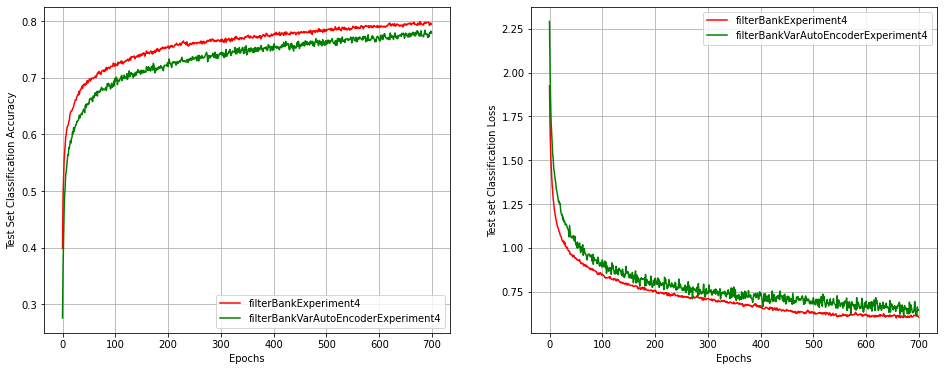

In [ ]:
plt.figure(figsize=(16, 6))
plt.subplot(1, 2, 1)
plt.xlabel("Epochs")
plt.ylabel("Test Set Classification Accuracy")
'''
sns.lineplot(x,y,color='r',label='filterBank')
sns.lineplot(x,y1,color='g',label='stft')
sns.lineplot(x,y2,color='b',label='mel')
'''
l1 = sns.lineplot(x,y,color='r',label='filterBankExperiment4')
l1.legend(loc="bottom right")
#l1.grid()


l2 = sns.lineplot(x1,y1,color='g',label='filterBankVarAutoEncoderExperiment4')
l2.legend(loc="bottom right")
l2.grid()


'''
l3 = sns.lineplot(x,y2,color='b',label='mel')
l3.legend(loc="bottom right")
l3.grid()
'''



plt.subplot(1, 2, 2)
plt.xlabel("Epochs")
plt.ylabel("Test set Classification Loss")

l1 = sns.lineplot(x,y3,color='r',label='filterBankExperiment4')
l1.legend(loc="upper right")
#l1.grid()

l2 = sns.lineplot(x1,y4,color='g',label='filterBankVarAutoEncoderExperiment4')
l2.legend(loc="upper right")
l2.grid()


'''
l3 = sns.lineplot(x,y5,color='b',label='mel')
l3.legend(loc="upper right")
l3.grid()
'''

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-package

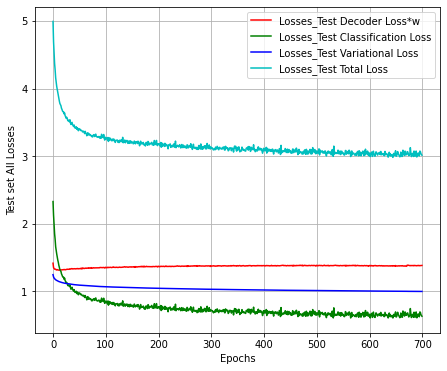

In [ ]:
plt.figure(figsize=(16, 6))
plt.subplot(1, 2, 2)
plt.xlabel("Epochs")
plt.ylabel("Test set All Losses")

l1 = sns.lineplot(x1,y6,color='r',label='Losses_Test Decoder Loss*w')
l1.legend(loc="upper right")
#l1.grid()

l2 = sns.lineplot(x1,y4,color='g',label='Losses_Test Classification Loss')
l2.legend(loc="upper right")
l2.grid()

l3 = sns.lineplot(x1,y7,color='b',label='Losses_Test Variational Loss')
l3.legend(loc="upper right")
l3.grid()

l4 = sns.lineplot(x1,y2,color='c',label='Losses_Test Total Loss')
l4.legend(loc="upper right")
l4.grid()

# **PyTorch Analysis Filter Bank / Encoder Model**

In [22]:
# Model Parameters
in_channels = 1
n_subbands = 256
filter_length = 512
downsampling = 256
padding = filter_length//2

In [23]:
# Analysis Filter Bank / Encoder
class Encoder(torch.nn.Module):
  """ Convolutional Neural Network Analysis Filter Bank for Musical Instruments Classification

  Author: Renato de Castro Rabelo Profeta, October 2020, TU Ilmenau, Germany
  """
  def __init__(self, in_channels=1,n_subbands=256,filter_length=512,downsampling = 256, padding=256, bias=True):
    super(Encoder, self).__init__()
    # Parameters
    self.in_channels = in_channels
    self.n_subbands = n_subbands
    self.filter_length=filter_length
    self.downsampling=downsampling
    self.padding = padding
    self.bias = bias
    # Layers
    self.conv1mean = torch.nn.Conv1d(in_channels=self.in_channels, out_channels=self.n_subbands, kernel_size=self.filter_length, 
                                 stride=self.downsampling, padding=self.padding, bias=self.bias)
    self.conv1std = torch.nn.Conv1d(in_channels=self.in_channels, out_channels=self.n_subbands, kernel_size=self.filter_length, 
                                 stride=self.downsampling, padding=self.padding, bias=self.bias)
    
  def encodermean(self, x):
        #Analysis:
        x = self.conv1mean(x)
        y = torch.tanh(x)
        return y
      
  def encoderstd(self, x):
        #Analysis:
        x = self.conv1std(x)
        y = torch.abs(torch.tanh(x))
        return y

  def forward(self, x):
    Yencmean=self.encodermean(x)
    Yencstd=self.encoderstd(x)
    #Yvariational= torch.normal(Yencmean, Yencstd)
    Yvariational= Yencmean + Yencstd*torch.randn_like(Yencstd)
    return Yencmean, Yencstd, Yvariational

# **Weights Initialization**

In [24]:
# Weights Initialization Function
def weights_init(m):
    if isinstance(m, nn.Conv1d):
        torch.nn.init.xavier_uniform_(m.weight.data)
        #torch.nn.init.zeros_(m.bias.data)
    if isinstance(m, nn.ConvTranspose1d):
        torch.nn.init.xavier_uniform_(m.weight.data)
        #torch.nn.init.zeros_(m.bias.data)
    if isinstance(m, nn.Conv2d):
        torch.nn.init.xavier_uniform_(m.weight.data)
        torch.nn.init.zeros_(m.bias.data)
    if isinstance(m, nn.Linear):
        torch.nn.init.xavier_uniform_(m.weight.data)
        torch.nn.init.zeros_(m.bias.data)

# **Testing Encoder before Training**

In [25]:
# Create Analysis Filter Bank model
analysisFB = Encoder(in_channels=in_channels,n_subbands=n_subbands,filter_length=filter_length,downsampling = downsampling, padding=padding)
# Initialize weights
analysisFB.apply(weights_init)
# Send to Device
analysisFB.to(device)

Encoder(
  (conv1mean): Conv1d(1, 256, kernel_size=(512,), stride=(256,), padding=(256,))
  (conv1std): Conv1d(1, 256, kernel_size=(512,), stride=(256,), padding=(256,))
)

# **PyTorch Synthesis Filter Bank / Decoder**

In [26]:

# Model Parameters
out_channels = 1
n_subbands = 256
filter_length = 512
upsampling = 256
dilatation=1
padding = 1

In [27]:

# Decoder
class Decoder(torch.nn.Module):
  """ Convolutional Neural Network Analysis Filter Bank for Musical Instruments Classification

  Author: Renato de Castro Rabelo Profeta, October 2020, TU Ilmenau, Germany
  """
  def __init__(self, n_subbands=256,out_channels=1, filter_length=512, umpsampling=256, dilatation=1, padding=1, bias=True):
    super(Decoder, self).__init__()
    self.n_subbands = n_subbands
    self.out_channels = out_channels
    self.filter_length=filter_length
    self.upsampling=upsampling
    self.dilatation=dilatation
    self.padding=padding
    self.bias=bias
    self.conv1 = torch.nn.ConvTranspose1d(in_channels=self.n_subbands, out_channels=self.out_channels , kernel_size=self.filter_length, 
                                          stride=self.upsampling, dilation=self.dilatation, padding=self.padding, bias=self.bias)
    
  def forward(self, x):
    x = self.conv1(x)
    return x

# **Testing Decoder before Training**

In [28]:
# Create Synthesis Filter Bank Model
synthesisFB = Decoder(n_subbands=n_subbands,out_channels=out_channels, filter_length=filter_length, umpsampling=upsampling, dilatation=1, padding=1)
# Initialize weights
synthesisFB.apply(weights_init)
# Send to Device
synthesisFB.to(device)

Decoder(
  (conv1): ConvTranspose1d(256, 1, kernel_size=(512,), stride=(256,), padding=(1,))
)

# **PyTorch CNN Classification Model**

In [29]:
# Model Parameters
n_classes=20

In [30]:
class classificationModel(torch.nn.Module):
  """ CNN CLassifier for an Analysis Filter Bank for Musical Instruments Classification
  
  Author: Renato de Castro Rabelo Profeta, October 2020, TU Ilmenau, Germany
  """
  def __init__(self, n_classes=20):
    super(classificationModel, self).__init__()
    self.n_classes=n_classes
    
    self.conv1 = torch.nn.Conv2d(1, 1, kernel_size=3, stride=1, padding=1)
    self.pool1 = torch.nn.MaxPool2d(2)
    self.dropout1 = torch.nn.Dropout(p=0.4)
    self.conv2 = torch.nn.Conv2d(1, 1, kernel_size=3, stride=1, padding=1)
    self.dropout2 = torch.nn.Dropout(p=0.4)
    self.adpavpool = torch.nn.AdaptiveAvgPool2d((8,8))
    self.fc1 = torch.nn.Linear(8*8, 32)
    self.fc2 = torch.nn.Linear(32, self.n_classes)
    
  def forward(self, x):
    x = x.unsqueeze(0)
    x = self.conv1(x)
    x = self.pool1(x)
    x = self.dropout1(x)
    x = self.conv2(x)
    x = self.dropout2(x)
    x = self.adpavpool(x)
    x = x.view(x.size()[0], -1)
    x = torch.sigmoid(self.fc1(x))
    x = F.softmax(self.fc2(x), dim=-1)
    return x

# **Test Classification Model before Training**

In [31]:
# Create Classification Model
classify = classificationModel()
# Initialize weights
classify.apply(weights_init)
# Send to Device
classify.to(device)

classificationModel(
  (conv1): Conv2d(1, 1, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (dropout1): Dropout(p=0.4, inplace=False)
  (conv2): Conv2d(1, 1, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (dropout2): Dropout(p=0.4, inplace=False)
  (adpavpool): AdaptiveAvgPool2d(output_size=(8, 8))
  (fc1): Linear(in_features=64, out_features=32, bias=True)
  (fc2): Linear(in_features=32, out_features=20, bias=True)
)

# **PyTorch CNN Autoencoder Model with Classification**

In [32]:
#Audoencoder
class Autoencoder(nn.Module):
  """ CNN Autoencoder with an Embedded CLassifier for Musical Instruments Classification
  
  Author: Renato de Castro Rabelo Profeta, October 2020, TU Ilmenau, Germany
  """
  
  def __init__(self, encoder, classifier, decoder):
    super(Autoencoder, self).__init__()
    self.encoder = encoder
    self.classifier = classifier
    self.decoder = decoder
    
  def forward(self, x):
    encodedmean,encodedstd,yvar = self.encoder(x)
    classified = self.classifier(yvar)
    decoded = self.decoder(yvar)
    return encodedmean,encodedstd,yvar, decoded, classified

# **Testing Autoencoder before Training**

In [33]:
# Create Autoencoder Model
autoencoder = Autoencoder(analysisFB,classify,synthesisFB)
# Send to Device
autoencoder.to(device)

Autoencoder(
  (encoder): Encoder(
    (conv1mean): Conv1d(1, 256, kernel_size=(512,), stride=(256,), padding=(256,))
    (conv1std): Conv1d(1, 256, kernel_size=(512,), stride=(256,), padding=(256,))
  )
  (classifier): classificationModel(
    (conv1): Conv2d(1, 1, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (dropout1): Dropout(p=0.4, inplace=False)
    (conv2): Conv2d(1, 1, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (dropout2): Dropout(p=0.4, inplace=False)
    (adpavpool): AdaptiveAvgPool2d(output_size=(8, 8))
    (fc1): Linear(in_features=64, out_features=32, bias=True)
    (fc2): Linear(in_features=32, out_features=20, bias=True)
  )
  (decoder): Decoder(
    (conv1): ConvTranspose1d(256, 1, kernel_size=(512,), stride=(256,), padding=(1,))
  )
)

# **Define a Loss Function**

In [34]:
'''
def variational_loss(mu, std):
    #returns the varialtional loss from arguments mean and standard deviation std
    #see also: see Appendix B from VAE paper:
    # Kingma and Welling. Auto-Encoding Variational Bayes. ICLR, 2014
    #https://arxiv.org/abs/1312.6114
    vl=-0.5*torch.mean(1+ 2*torch.log(std)-mu.pow(2) -(std.pow(2)))
    return vl
'''

class variational_loss(nn.Module):
    def __init__(self):
        super(variational_loss, self).__init__()

    def forward(self, mu, std):
        eps=1e-10
        tmp_std = std.clone()
        torch.clamp_(tmp_std, min=eps, max = 1-eps)
        vl=-0.5*torch.mean(1+ 2*torch.log(tmp_std)-mu.pow(2) -(tmp_std.pow(2)))
        return vl

In [35]:
class categorical_cross_entropy(nn.Module):
    ''' Categorical Cross Entropy similar to Keras/TensorFlow
        "Categorical crossentropy between an output tensor and a target tensor" - https://www.tensorflow.org/api_docs/python/tf/keras/backend/categorical_crossentropy
        https://github.com/tensorflow/tensorflow/blob/r1.13/tensorflow/python/keras/backend.py
        target: A tensor of the same shape as `inputX`.
        inputX: A tensor resulting from a softmax

        Ported to PyTorch by Renato Profeta, October 2020
    '''
    def __init__(self):
        super(categorical_cross_entropy, self).__init__()

    def forward(self, inputX, target):
        eps=1e-10
        tmp = inputX.clone()
        tmp /= torch.sum(tmp)
        torch.clamp_(tmp, min=eps, max = 1-eps)
        return torch.mean(-torch.sum(target * torch.log(tmp.double()), dim=-1), dim=-1)

# **Set a Loss Function and an Optimizer for the Experiment**

In [36]:
# Loss Functions
loss_classification = categorical_cross_entropy()
loss_decoder = torch.nn.MSELoss()
variational_loss = variational_loss()

# Optimizer
lr=0.01
#optimizer = optim.SGD(autoencoder.parameters(), lr=lr)
optimizer = optim.Adagrad(autoencoder.parameters(), lr=0.01, lr_decay=0, weight_decay=0, initial_accumulator_value=0, eps=1e-10)
#optimizer = optim.ASGD(autoencoder.parameters(), lr=lr)

# **Auxiliary Functions for Progress Monitoring**

In [37]:
# https://colab.research.google.com/drive/11v_mM2ImWdKDs_4qkoB9TdsQiPgVeeo2#scrollTo=NQgIwI5WC-07        
class ProgressMonitor(object):
    """
    Custom IPython progress bar
    """
    
    tmpl_train ="""
        <p> Train Epoch: {epoch} / {num_epochs} <br>
        Step: {value} / {length} - Train <br>
        Loss Classification: {loss_classify:0.4f} / Accuracy Classification: {accuracy_classify:0.4f} <br> 
        Loss Decoder: {loss_decoder:0.4f} <br>
        Total Loss: {loss_total:0.4f}</p>
        <progress value='{value}' max='{length}', style='width: 100%'>{value}</progress>
        <br>"""
    
    tmpl_test= """
        <p>Test Epoch: {epoch} / {num_epochs} <br>
        Step: {value} / {length} - Test <br>
        Loss Classification: {loss_classify:0.4f} / Accuracy Classification: {accuracy_classify:0.4f} <br> 
        Loss Decoder: {loss_decoder:0.4f} <br>
        Total Loss: {loss_total:0.4f}</p> </p>
        <progress value='{value}' max='{length}', style='width: 100%'>{value}</progress>
        <br>"""

    def __init__(self, length, mode):
        self.length = length
        self.count = 0
        self.mode = mode
        self.display = display(self.html(0, 0, 0, 0, 0, 0, 0, mode), display_id=True)   
        
    def html(self, count, epoch, num_epochs, loss_classify, accuracy_classify, loss_decoder, loss_total,mode="train"):
        if mode=="train":
            return HTML(self.tmpl_train.format(length=self.length, value=count, epoch=epoch, num_epochs=num_epochs, 
                                               loss_classify=loss_classify, accuracy_classify=accuracy_classify,
                                               loss_decoder=loss_decoder,loss_total=loss_total))
        else:
            return HTML(self.tmpl_test.format(length=self.length, value=count, epoch=epoch, num_epochs=num_epochs, 
                                               loss_classify=loss_classify, accuracy_classify=accuracy_classify,
                                               loss_decoder=loss_decoder, loss_total=loss_total))
            
    def update(self, count, epoch, num_epochs, loss_classify, accuracy_classify,loss_decoder,loss_total,mode="train"):
        self.count += count
        self.display.update(self.html(self.count, epoch, num_epochs, loss_classify, accuracy_classify, loss_decoder, loss_total, mode))

In [38]:

# https://colab.research.google.com/drive/1gJAAN3UI9005ecVmxPun5ZLCGu4YBtLo#scrollTo=ZvoPaJvs7Eem
class AverageBase(object):
    
    def __init__(self, value=0):
        self.value = float(value) if value is not None else None
       
    def __str__(self):
        return str(round(self.value, 4))
    
    def __repr__(self):
        return self.value
    
    def __format__(self, fmt):
        return self.value.__format__(fmt)
    
    def __float__(self):
        return self.value
    

class RunningAverage(AverageBase):
    """
    Keeps track of a cumulative moving average (CMA).
    """
    
    def __init__(self, value=0, count=0):
        super(RunningAverage, self).__init__(value)
        self.count = count
        
    def update(self, value):
        self.value = (self.value * self.count + float(value))
        self.count += 1
        self.value /= self.count
        return self.value

class MovingAverage(AverageBase):
    """
    An exponentially decaying moving average (EMA).
    """
    
    def __init__(self, alpha=0.99):
        super(MovingAverage, self).__init__(None)
        self.alpha = alpha
        
    def update(self, value):
        if self.value is None:
            self.value = float(value)
        else:
            self.value = self.alpha * self.value + (1 - self.alpha) * float(value)
        return self.value

# **Auxiliary Functions to load best Model Parameters**

In [39]:
# Load a Model
def load_checkpoint(optimizer, loss_classification, loss_decoder, model, filename):
    checkpoint_dict = torch.load(filename)
    epoch = checkpoint_dict['epoch']
    model.load_state_dict(checkpoint_dict['model'])
    loss_classification.load_state_dict(checkpoint_dict['loss_classification'])
    loss_decoder.load_state_dict(checkpoint_dict['loss_decoder'])
    if optimizer is not None:
        optimizer.load_state_dict(checkpoint_dict['optimizer'])
    return epoch

# **Funtion to Test a Model**

In [40]:
def testModel(model, epoch, num_epochs, monitoring=True):
  """ Function to Test a Model

  Author: Renato de Castro Rabelo Profeta, October 2020, TU Ilmenau, Germany
  """
  if monitoring:
    #Create a Progress Bar
    progress = ProgressMonitor(length=len(test_set), mode="test")
    
    
  # validation phase
  model.eval()
    
  # Initialize Metrics
  test_loss_classify = MovingAverage()
  test_loss_decoder = MovingAverage()
  test_loss_total = MovingAverage()
  test_acc = MovingAverage()

  # keep track of predictions
  y_pred = []
  rmse_total = []
    
  with torch.no_grad():
    for batch, targets in validation_generator:
      
      # Move the training batch to the GPU
      batch = batch.to(device)
      targets = targets.to(device)

      # forward propagation
      encodedmean, encodedstd, yvar, decoded, classified = model(batch)
      vl=variational_loss(encodedmean, encodedstd)

      # Check the array with higher length
      if decoded.size() > batch.size():
        target = torch.zeros(decoded.shape).to(device)
        target[0,0,:batch.shape[-1]]=batch[0,0,:]
      else:
        target = batch[:,:,:decoded.shape[-1]]

      # calculate the loss
      loss1 = loss_classification(classified, targets)
      loss2 = loss_decoder(decoded, target)

      loss = w_class*loss1 + w_decoder*loss2 + w_var*vl
      rmse = torch.sqrt(loss2)

      # update average loss
      test_loss_classify.update(loss1)
      test_loss_decoder.update(loss2)
      test_loss_total.update(loss)

      # save predictions
      y_pred.extend(classified.argmax(dim=1).cpu().numpy())
      rmse_total.append([rmse.cpu().detach().numpy()])

      # Validation Accuracy
      y_pred_torch = torch.tensor(y_pred, dtype=torch.int64)
      accuracy = torch.mean((y_pred_torch == torch.tensor(np.argmax(onehot_labels_test[:len(y_pred)],axis=1), dtype=torch.int64)).float())
      test_acc.update(accuracy)

      # Update Progress Bar
      if monitoring:
        progress.update(batch.shape[0], epoch, num_epochs, test_loss_classify, test_acc, test_loss_decoder, test_loss_total, mode="test")

        
    return test_loss_classify.value, test_loss_decoder.value, test_loss_total.value, test_acc.value, y_pred, rmse_total

# **Experiment Parameters**

In [41]:
n_epochs = 100

# Weights for Loss Functions
w_class = 1
w_decoder=100
w_var = 1

In [42]:
def experiment(model, num_epochs = n_epochs, first_epoch = 1, monitoring=True, test_monitor=True):
  """ Function to Test a Model

  Author: Renato de Castro Rabelo Profeta, October 2020, TU Ilmenau, Germany
  """
  
  #Initialze Metrics
  
  valid_losses = []
  valid_accuracies = []
  valid_losses_decoder = []
  valid_losses_total=[]
  valid_predictions = []
  valid_rmse = []
  
  for epoch in range(first_epoch, num_epochs+1):
    

    if test_monitor:
      #Test Model
      valid_loss, test_loss_decoder, test_loss_total, valid_acc, y_pred, test_rmse  = testModel(model, epoch, num_epochs, monitoring)
    else:
      valid_loss=0
      test_loss_decoder=0
      test_loss_total=0
      valid_acc = 0
      y_pred = 0
      test_rmse = 0
      
    #Save Test Losses and Accuracies
    valid_losses.append(valid_loss)
    valid_losses_decoder.append(test_loss_decoder)
    valid_losses_total.append(test_loss_total)
    valid_accuracies.append(valid_acc)
    valid_predictions.append(y_pred)
    valid_rmse.append(test_rmse)


              
  return {"valid_loss": valid_losses, "valid_loss_decoder": valid_losses_decoder, "valid_loss_total": valid_losses_total, "valid_accuracies": valid_accuracies,
            "valid_predictions":  valid_predictions, "valid_rmse": valid_rmse}

# **Resume an Experiment from a saved Checkpoint**

In [43]:
n_epochs=697
epoch = load_checkpoint(optimizer, loss_classification, loss_decoder, autoencoder, 'checkpoints/content/checkpoints/AutoencoderInstrumetClassif-696.pkl')
print('Resuming training from epoch', epoch)
hist = experiment(autoencoder, num_epochs=n_epochs, first_epoch=epoch+1, test_monitor=True, monitoring=True)

Resuming training from epoch 696


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


In [46]:
plot_data = {"hist": hist}
pickle.dump( plot_data, open( "histVarAutoEncexp4.pkl", "wb" ) )

In [53]:
#print(hist['valid_rmse'][0][3420])
#print(type(hist['valid_rmse'][0][3420]))
#print(len(hist['valid_predictions']))
print(len(hist['valid_rmse'][0]))
#print(hist['valid_predictions'][0][3420])
print(max(hist['valid_rmse'][0]))

3421
[array(0.29009816, dtype=float32)]


# **Experiment Results**

In [54]:
# Number of Validation Classification Errors
num_errors = torch.sum((torch.tensor(hist["valid_predictions"]) != torch.tensor(np.argmax(onehot_labels_test,axis=1))).float())
print('Validation errors {} (out of {})'.format(int(num_errors), len(test_set)))
num_correct = torch.sum((torch.tensor(hist["valid_predictions"]) == torch.tensor(np.argmax(onehot_labels_test,axis=1))).float())
print('Validation correct {} (out of {})'.format(int(num_correct), len(test_set)))

Validation errors 739 (out of 3421)
Validation correct 2682 (out of 3421)


In [55]:
# Validation Classification Mistakes
error_indicator = torch.tensor(hist["valid_predictions"]) != torch.tensor(np.argmax(onehot_labels_test,axis=1))
correct_indicator = torch.tensor(hist["valid_predictions"]) == torch.tensor(np.argmax(onehot_labels_test,axis=1))
#print(np.where(error_indicator[0,:]))
#print(np.where(correct_indicator[0,:]))
wrong_pred = np.where(error_indicator[0,:])
correct_pred =  np.where(correct_indicator[0,:])
nos_err = int(num_errors)
nos_corr = int(num_correct)
nos_all = len(test_set)

#print((int(num_errors)))
#print((int(num_correct)))
#print(wrong_pred[0][nos_err - 1])
#print(correct_pred[0][nos_corr - 1])
print(nos_all)

rmse_wrong_pred = []
rmse_correct_pred = []
rmse_all_pred = []

for x in range(nos_err):
  rmse_wrong_pred.append(hist['valid_rmse'][0][(wrong_pred[0][x])])

for y in range(nos_corr):
  rmse_correct_pred.append(hist['valid_rmse'][0][(correct_pred[0][y])])

for z in range(nos_all):
  rmse_all_pred.append(hist['valid_rmse'][0][z])

print(type(rmse_all_pred))
print(rmse_all_pred[0])


#print(test_set['filename'].values[0])
#print(test_set['filename'].values[1])
#print(type(np.where(error_indicator[0,:])))
print("Wrongly predicted Audio Files", test_set['filename'].values[np.where(error_indicator[0,:])])
#print("rmse of wrongly predicted audio files" , hist["valid_rmse"].values[np.where(error_indicator[0,:])])
print("Correct Classes:", test_set['class'].values[np.where(error_indicator[0,:])])
print("Predicted as:",labelencoder.inverse_transform(np.ravel(np.array(hist["valid_predictions"])[np.where(error_indicator)])))

3421
<class 'list'>
[array(0.04918146, dtype=float32)]
Wrongly predicted Audio Files ['./all-samples/cello/cello_Fs5_05_pianissimo_arco-normal.npy'
 './all-samples/violin/violin_Cs4_1_mezzo-piano_con-sord.npy'
 './all-samples/bassoon/bassoon_E4_1_forte_normal.npy'
 './all-samples/violin/violin_F5_05_forte_arco-normal.npy'
 './all-samples/cello/cello_G5_1_mezzo-piano_arco-normal.npy'
 './all-samples/contrabassoon/contrabassoon_Gs3_long_forte_fluttertonguing.npy'
 './all-samples/oboe/oboe_G6_025_piano_normal.npy'
 './all-samples/tuba/tuba_As3_long_forte_glissando.npy'
 './all-samples/flute/flute_B4_05_pianissimo_normal.npy'
 './all-samples/viola/viola_Ds5_1_mezzo-forte_molto-vibrato.npy'
 './all-samples/flute/flute_Fs5_05_piano_normal.npy'
 './all-samples/violin/violin_D6_1_mezzo-forte_arco-sul-ponticello.npy'
 './all-samples/trombone/trombone_B4_long_fortissimo_normal.npy'
 './all-samples/trumpet/trumpet_Cs6_1_mezzo-forte_normal.npy'
 './all-samples/violin/violin_A6_1_piano_natural-harm

In [56]:
ranges_rmse = np.linspace(0.0000, 0.3400, num=25)
print(ranges_rmse)

[0.         0.01416667 0.02833333 0.0425     0.05666667 0.07083333
 0.085      0.09916667 0.11333333 0.1275     0.14166667 0.15583333
 0.17       0.18416667 0.19833333 0.2125     0.22666667 0.24083333
 0.255      0.26916667 0.28333333 0.2975     0.31166667 0.32583333
 0.34      ]


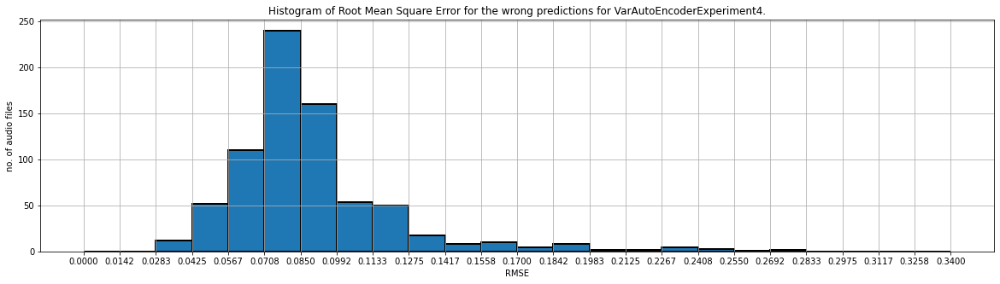

In [57]:
fig,ax = plt.subplots(1,1,figsize=(20,5))

a = np.array(rmse_wrong_pred)
l1 = ax.hist(a, bins = ranges_rmse,edgecolor="black",linewidth=2)
#l1 = ax.hist(a, bins = [0,0.0050,0.0100,0.0150,0.0200,0.0250,0.0300,0.0350,0.0400,0.0450,0.0500,0.0550,0.0600,0.0650,0.0700,0.0750,0.0800,0.0850,0.0900,0.0950,0.1000,0.1050,0.1100,0.1150,0.1200,0.1250,0.1300],edgecolor="black",linewidth=2)
#l1 = ax.hist(a, bins = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25],edgecolor="black",linewidth=2)
ax.set_title("Histogram of Root Mean Square Error for the wrong predictions for VarAutoEncoderExperiment4.")
ax.set_xticks(ranges_rmse)
#ax.set_xticks([0,0.0050,0.0100,0.0150,0.0200,0.0250,0.0300,0.0350,0.0400,0.0450,0.0500,0.0550,0.0600,0.0650,0.0700,0.0750,0.0800,0.0850,0.0900,0.0950,0.1000,0.1050,0.1100,0.1150,0.1200,0.1250,0.1300])
#ax.set_xticks([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25])
ax.set_xlabel('RMSE')
ax.set_ylabel('no. of audio files')
ax.grid()
plt.show()

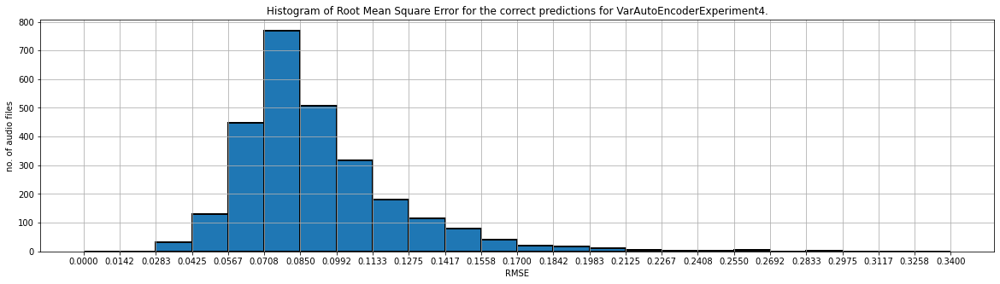

In [58]:

fig,ax = plt.subplots(1,1,figsize=(20,5))

a = np.array(rmse_correct_pred)
l1 = ax.hist(a, bins = ranges_rmse,edgecolor="black",linewidth=2)
#l1 = ax.hist(a, bins = [0,0.0050,0.0100,0.0150,0.0200,0.0250,0.0300,0.0350,0.0400,0.0450,0.0500,0.0550,0.0600,0.0650,0.0700,0.0750,0.0800,0.0850,0.0900,0.0950,0.1000,0.1050,0.1100,0.1150,0.1200,0.1250,0.1300],edgecolor="black",linewidth=2)
#l1 = ax.hist(a, bins = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25],edgecolor="black",linewidth=2)
ax.set_title("Histogram of Root Mean Square Error for the correct predictions for VarAutoEncoderExperiment4.")
ax.set_xticks(ranges_rmse)
#ax.set_xticks([0,0.0050,0.0100,0.0150,0.0200,0.0250,0.0300,0.0350,0.0400,0.0450,0.0500,0.0550,0.0600,0.0650,0.0700,0.0750,0.0800,0.0850,0.0900,0.0950,0.1000,0.1050,0.1100,0.1150,0.1200,0.1250,0.1300])
#ax.set_xticks([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25])
ax.set_xlabel('RMSE')
ax.set_ylabel('no. of audio files')
ax.grid()
plt.show()

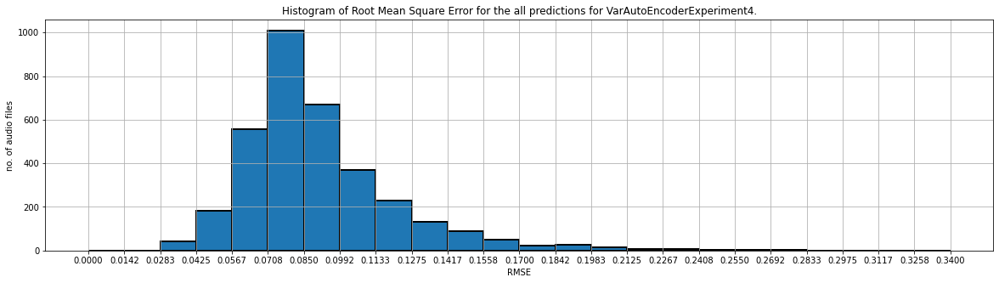

In [59]:
fig,ax = plt.subplots(1,1,figsize=(20,5))

a = np.array(rmse_all_pred)
l1 = ax.hist(a, bins = ranges_rmse,edgecolor="black",linewidth=2)
#l1 = ax.hist(a, bins = [0,0.0050,0.0100,0.0150,0.0200,0.0250,0.0300,0.0350,0.0400,0.0450,0.0500,0.0550,0.0600,0.0650,0.0700,0.0750,0.0800,0.0850,0.0900,0.0950,0.1000,0.1050,0.1100,0.1150,0.1200,0.1250,0.1300],edgecolor="black",linewidth=2)
#l1 = ax.hist(a, bins = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25],edgecolor="black",linewidth=2)
ax.set_title("Histogram of Root Mean Square Error for the all predictions for VarAutoEncoderExperiment4.")
ax.set_xticks(ranges_rmse)
#ax.set_xticks([0,0.0050,0.0100,0.0150,0.0200,0.0250,0.0300,0.0350,0.0400,0.0450,0.0500,0.0550,0.0600,0.0650,0.0700,0.0750,0.0800,0.0850,0.0900,0.0950,0.1000,0.1050,0.1100,0.1150,0.1200,0.1250,0.1300])
#ax.set_xticks([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25])
ax.set_xlabel('RMSE')
ax.set_ylabel('no. of audio files')
ax.grid()
plt.show()

In [60]:
# Back to Labels
predictions_labels=labelencoder.inverse_transform(np.ravel(hist["valid_predictions"]));

In [61]:

# Recall - the ability of the classifier to find all the positive samples
print("Recall: ", recall_score(classes_int_test, np.array(hist["valid_predictions"])[0,:],average=None))

# Precision - The precision is intuitively the ability of the classifier not to 
#label as positive a sample that is negative
print("Precision: ", precision_score(classes_int_test, np.array(hist["valid_predictions"])[0,:],average=None, zero_division=0))

# F1-Score - The F1 score can be interpreted as a weighted average of the precision 
#and recall
print("F1-Score: ", f1_score(classes_int_test, np.array(hist["valid_predictions"])[0,:], average=None))

# Accuracy - the number of correctly classified samples
print("Accuracy: %.2f  ," % accuracy_score(classes_int_test, np.array(hist["valid_predictions"])[0,:] ,normalize=True), accuracy_score(classes_int_test, np.array(hist["valid_predictions"])[0,:],normalize=False) )
print("Number of samples:",classes_int_test.shape[0])

print(classification_report(classes_int_test, np.array(hist["valid_predictions"])[0,:], zero_division=0))

Recall:  [0.88888889 0.90254237 0.84444444 0.53603604 0.86792453 0.79213483
 0.75117371 0.90751445 0.65       0.83435583 0.76923077 0.75
 0.87248322 0.59459459 0.72677596 0.83653846 0.61983471 0.83127572
 0.81069959 0.77925532]
Precision:  [0.88888889 0.930131   0.7715736  0.64324324 0.81057269 0.71212121
 0.82474227 0.92352941 0.66511628 0.80952381 0.90909091 0.78947368
 0.79268293 0.64705882 0.84177215 0.87878788 0.74257426 0.7890625
 0.67006803 0.78342246]
F1-Score:  [0.88888889 0.91612903 0.80636605 0.58476658 0.83826879 0.75
 0.78624079 0.9154519  0.65747126 0.82175227 0.83333333 0.76923077
 0.83067093 0.61971831 0.78005865 0.85714286 0.67567568 0.80961924
 0.73370577 0.78133333]
Accuracy: 0.78  , 2682
Number of samples: 3421
              precision    recall  f1-score   support

           0       0.89      0.89      0.89        18
           1       0.93      0.90      0.92       236
           2       0.77      0.84      0.81       180
           3       0.64      0.54      0.5

In [62]:
# Compute confusion matrix
cnf_matrix = confusion_matrix(classes_int_test, np.array(hist["valid_predictions"])[0,:])
np.set_printoptions(precision=2)

In [63]:
# Function to Plot Confusion Matrix
# http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')
    """
    #print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

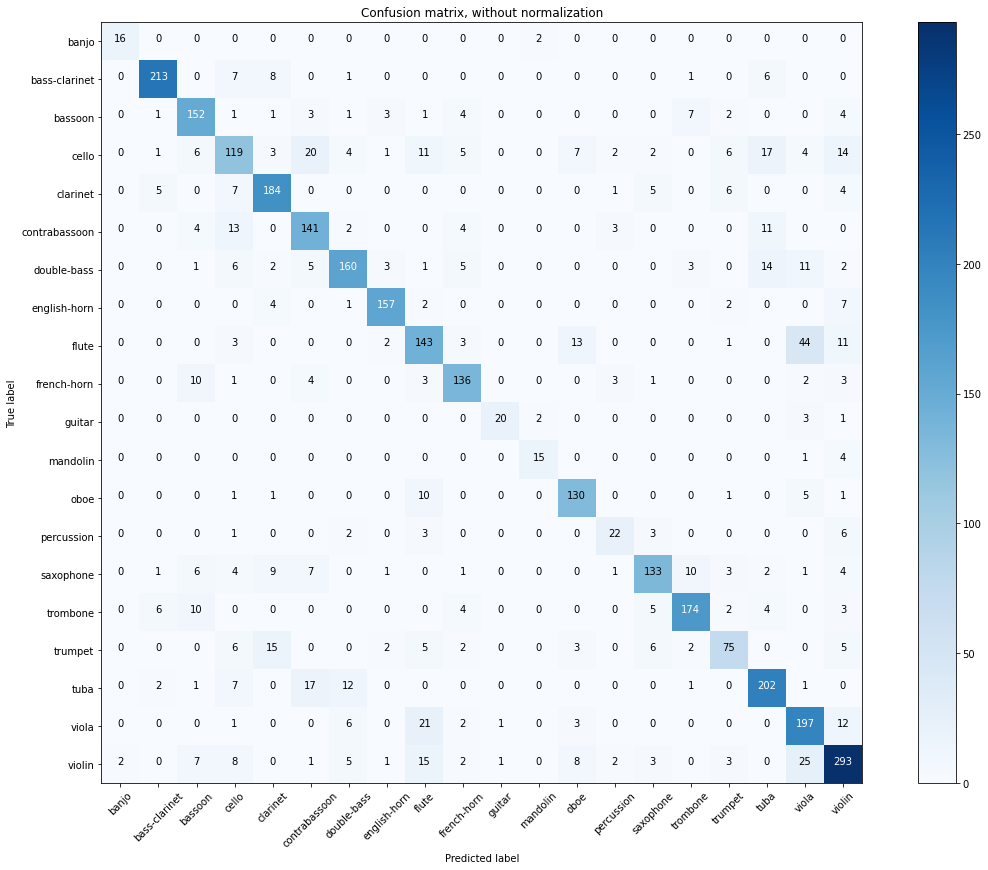

In [64]:
# Plot non-normalized confusion matrix
plt.figure(figsize=(16,12))
plot_confusion_matrix(cnf_matrix, classes=labelencoder.classes_,
                      title='Confusion matrix, without normalization')

# **Playback of 1st random Audio Files**

In [65]:
# Get a random audio file and label from dataset
dataiter = iter(DataLoader(test_set_torch, batch_size=1, shuffle=True, num_workers=0))
audio_to_test, label_to_test = dataiter.next()

In [66]:
# Test
test_encoded_mean,test_encoded_std,test_yvar, test_output, test_type = autoencoder(audio_to_test.to(device))
print('Original Shape', audio_to_test.shape)
#print('Encoded Shape', test_encoded.shape)
print('Decoded Shape', test_output.shape)
print('Predicted Class', np.argmax(test_type.detach().cpu().numpy()))
print('Correct Class', np.argmax(label_to_test.detach().cpu().numpy()))
print('MSE', mean_squared_error(audio_to_test[0,0,:], test_output[0,0,:audio_to_test.shape[-1]].detach().cpu()))
MSE = mean_squared_error(audio_to_test[0,0,:], test_output[0,0,:audio_to_test.shape[-1]].detach().cpu())
rmse = np.sqrt(MSE)
print('RMSE',rmse)

Original Shape torch.Size([1, 1, 24192])
Decoded Shape torch.Size([1, 1, 24574])
Predicted Class 7
Correct Class 7
MSE 0.005716343
RMSE 0.0756065


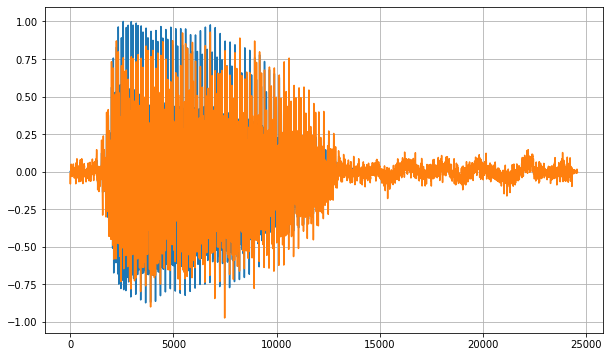

In [67]:
# Plot Waveform of audio to test
plt.figure(figsize=(10,6))
plt.plot(audio_to_test[0,0,:])
plt.plot(test_output[0,0,:].detach().cpu().numpy())
plt.grid()

In [68]:
print("Model Output")
display(ipd.Audio(test_output[0,0,:].detach().cpu().numpy(), rate=44100))
print("Model Input")
display(ipd.Audio(audio_to_test[0,0,:], rate=44100))

Model Output


Model Input


In [ ]:
original_audio_specgram = torchaudio.transforms.Spectrogram(n_fft=2048)(audio_to_test[0,0,:])

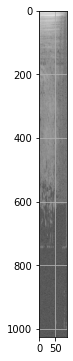

In [ ]:
plt.figure(figsize=(10,6))
plt.imshow(20*original_audio_specgram.log10().numpy(), cmap='gray')
plt.grid()

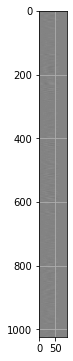

In [ ]:
plt.figure(figsize=(10,6))
plt.imshow(test_encoded[0,:,:].detach().cpu().numpy(), cmap='gray')
plt.grid()

In [ ]:
specgram_decoded_audio = torchaudio.transforms.Spectrogram(n_fft=2048)(test_output[0,0,:].to('cpu'))

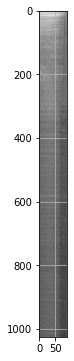

In [ ]:
plt.figure(figsize=(10,6))
plt.imshow(20*specgram_decoded_audio.log10().detach().numpy(), cmap='gray')
plt.grid()

# **Playback of 2nd random Audio File**

In [70]:
# Get a random audio file and label from dataset
dataiter = iter(DataLoader(test_set_torch, batch_size=1, shuffle=True, num_workers=0))
audio_to_test, label_to_test = dataiter.next()

In [71]:
# Test
test_encoded_mean,test_encoded_std,test_yvar, test_output, test_type = autoencoder(audio_to_test.to(device))
print('Original Shape', audio_to_test.shape)
#print('Encoded Shape', test_encoded.shape)
print('Decoded Shape', test_output.shape)
print('Predicted Class', np.argmax(test_type.detach().cpu().numpy()))
print('Correct Class', np.argmax(label_to_test.detach().cpu().numpy()))
print('MSE', mean_squared_error(audio_to_test[0,0,:], test_output[0,0,:audio_to_test.shape[-1]].detach().cpu()))
MSE = mean_squared_error(audio_to_test[0,0,:], test_output[0,0,:audio_to_test.shape[-1]].detach().cpu())
rmse = np.sqrt(MSE)
print('RMSE',rmse)

Original Shape torch.Size([1, 1, 86400])
Decoded Shape torch.Size([1, 1, 86782])
Predicted Class 19
Correct Class 19
MSE 0.0060969987
RMSE 0.078083284


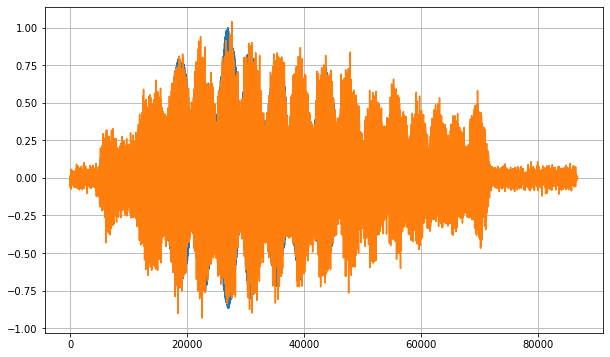

In [72]:
# Plot Waveform of audio to test
plt.figure(figsize=(10,6))
plt.plot(audio_to_test[0,0,:])
plt.plot(test_output[0,0,:].detach().cpu().numpy())
plt.grid()

In [73]:
print("Model Output")
display(ipd.Audio(test_output[0,0,:].detach().cpu().numpy(), rate=44100))
print("Model Input")
display(ipd.Audio(audio_to_test[0,0,:], rate=44100))

Model Output


Model Input


# **Playback of 3rd random Audio File**

In [74]:
# Get a random audio file and label from dataset
dataiter = iter(DataLoader(test_set_torch, batch_size=1, shuffle=True, num_workers=0))
audio_to_test, label_to_test = dataiter.next()

In [75]:
# Test
test_encoded_mean,test_encoded_std,test_yvar, test_output, test_type = autoencoder(audio_to_test.to(device))
print('Original Shape', audio_to_test.shape)
#print('Encoded Shape', test_encoded.shape)
print('Decoded Shape', test_output.shape)
print('Predicted Class', np.argmax(test_type.detach().cpu().numpy()))
print('Correct Class', np.argmax(label_to_test.detach().cpu().numpy()))
print('MSE', mean_squared_error(audio_to_test[0,0,:], test_output[0,0,:audio_to_test.shape[-1]].detach().cpu()))
MSE = mean_squared_error(audio_to_test[0,0,:], test_output[0,0,:audio_to_test.shape[-1]].detach().cpu())
rmse = np.sqrt(MSE)
print('RMSE',rmse)

Original Shape torch.Size([1, 1, 273024])
Decoded Shape torch.Size([1, 1, 273406])
Predicted Class 15
Correct Class 15
MSE 0.0028351636
RMSE 0.053246256


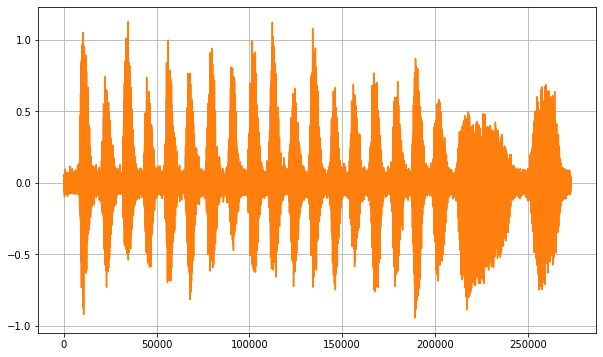

In [76]:
# Plot Waveform of audio to test
plt.figure(figsize=(10,6))
plt.plot(audio_to_test[0,0,:])
plt.plot(test_output[0,0,:].detach().cpu().numpy())
plt.grid()

In [77]:
print("Model Output")
display(ipd.Audio(test_output[0,0,:].detach().cpu().numpy(), rate=44100))
print("Model Input")
display(ipd.Audio(audio_to_test[0,0,:], rate=44100))

Model Output


Model Input
